## Semantic segmentation 

### This is a multi-class semantic segmentation problem. Let's solve it using YOLOv8

In [2]:
# Importing necessary libraries
import os
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import random
import copy
import shutil
import numpy as np
import ipywidgets as widgets
import wandb

In [3]:
# Installing ultralytics
!pip install ultralytics


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
# Importing YOLO
from ultralytics import YOLO

You will need a unique API key to log in to Weights & Biases. 

1. If you don't have a Weights & Biases account, you can go to https://wandb.ai/site and create a FREE account.
2. Access your API key: https://wandb.ai/authorize.

There are two ways you can login using a Kaggle kernel:

1. Run a cell with `wandb.login()`. It will ask for the API key, which you can copy + paste in.
2. You can also use Kaggle secrets to store your API key and use the code snippet below to login. Check out this [discussion post](https://www.kaggle.com/product-feedback/114053) to learn more about Kaggle secrets. 



In [5]:
#from kaggle_secrets import UserSecretsClient
#user_secrets = UserSecretsClient()
secret_value_0 = "02996d915e43061bec2b9633103b604d15f09925"

In [6]:
wandb.login(key=secret_value_0)

wandb: Currently logged in as: harshisamalia (smart_exploration). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: C:\Users\harsh\.netrc


True

## Creating working directories

In [7]:
# Defining input images and masks path
ip_path = 'D:/University_Windsor/Winter_2024/ASE/POC'

train_images_path=os.path.join(ip_path,'semantic-segmentation-of-underwater-imagery-suim', 'train_val'
                               ,'images')
test_images_path=os.path.join(ip_path,'semantic-segmentation-of-underwater-imagery-suim', 'TEST'
                               ,'images')
train_masks_path=os.path.join(ip_path,'semantic-segmentation-of-underwater-imagery-suim', 'train_val'
                               ,'masks')
test_masks_path=os.path.join(ip_path,'semantic-segmentation-of-underwater-imagery-suim', 'TEST'
                               ,'masks')

In [9]:
# Defining output train,val and test paths
op_path = 'D:/University_Windsor/Winter_2024/ASE/POC'

op_labels_path=os.path.join(op_path, 'labels')
op_images_path=os.path.join(op_path, 'images')

op_images_trainpath=os.path.join(op_images_path, 'train')
op_images_valpath=os.path.join(op_images_path, 'val')
op_images_testpath=os.path.join(op_images_path, 'test')
op_labels_trainpath=os.path.join(op_labels_path, 'train')
op_labels_valpath=os.path.join(op_labels_path, 'val')
op_labels_testpath=os.path.join(op_labels_path, 'test')

os.makedirs(op_images_trainpath)
os.makedirs(op_images_valpath)
os.makedirs(op_images_testpath)
os.makedirs(op_labels_trainpath)
os.makedirs(op_labels_valpath)
os.makedirs(op_labels_testpath)

In [10]:
# Sorting images and masks
train_imgs_list=sorted(os.listdir(train_images_path))
train_masks_list=sorted(os.listdir(train_masks_path))

test_imgs_list=sorted(os.listdir(test_images_path))
test_masks_list=sorted(os.listdir(test_masks_path))

There are various directories present in TEST masks which contain binary images. So let's filter the bmp images only (which are actually multi-class masks)

In [11]:
test_masks_list=list(filter (lambda x: x.endswith('bmp'), test_masks_list))

In [12]:
# Checking size of training images
total_images_train=len(train_imgs_list)
total_images_train

1525

In [13]:
# Checking size of test images
total_images_test=len(test_imgs_list)
total_images_test

110

## Visualising images and masks

Let's write a function to display the image and its corresponding mask

In [14]:
def plot_image_and_mask():
    figure,axis = plt.subplots(1,2,figsize=(30,30))
    plt.axis('off')
    k=random.randint(0, total_images_train-1) # choosing any random image number
    
    img_path=os.path.join(train_images_path, train_imgs_list[k]) # defining image path
    mask_path=os.path.join(train_masks_path, train_masks_list[k]) # defining mask path
    
    img_title=os.path.basename(img_path) # extracting image filename from path
    mask_title=os.path.basename(mask_path) # extracting mask filename from path
    
    # displaying image and mask
    axis[0].imshow(cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB))
    axis[0].set_title(img_title, fontsize=30)
    axis[0].set_xticks([])
    axis[0].set_yticks([])
    axis[1].imshow(cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB))
    axis[1].set_title(mask_title, fontsize=30)
    axis[1].set_xticks([])
    axis[1].set_yticks([])

    plt.tight_layout()
    plt.show()

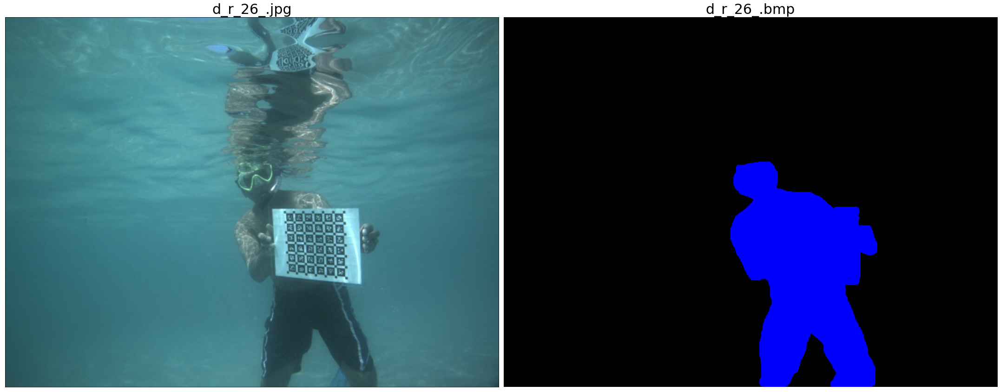

In [15]:
plot_image_and_mask()

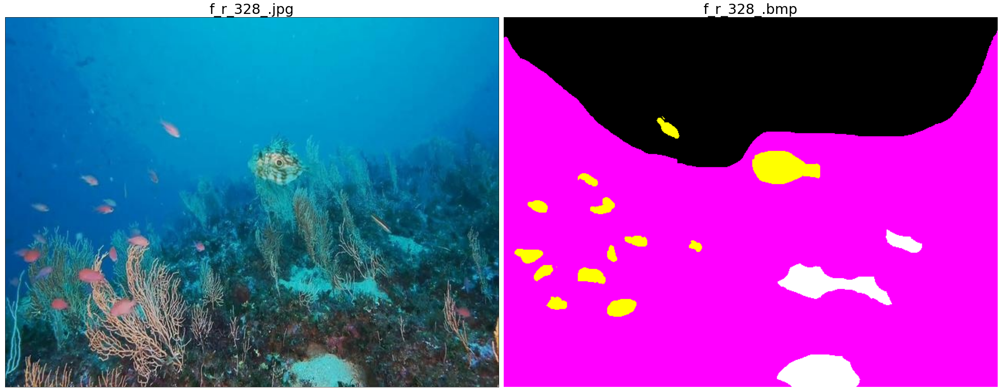

In [16]:
plot_image_and_mask()

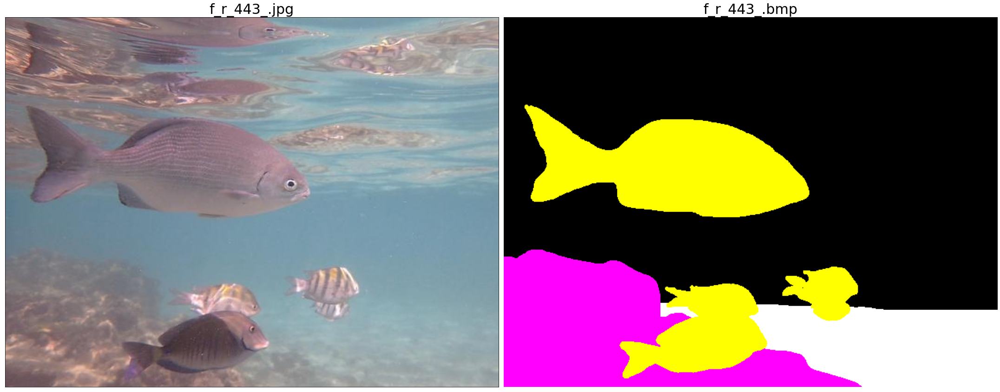

In [17]:
plot_image_and_mask()

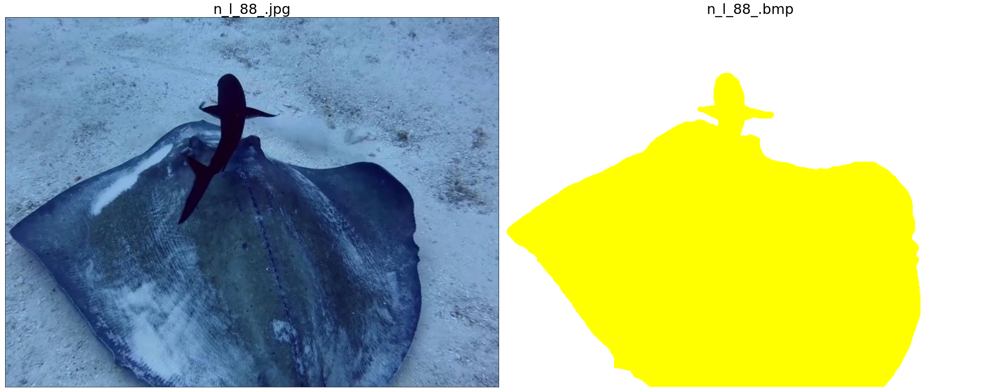

In [18]:
plot_image_and_mask()

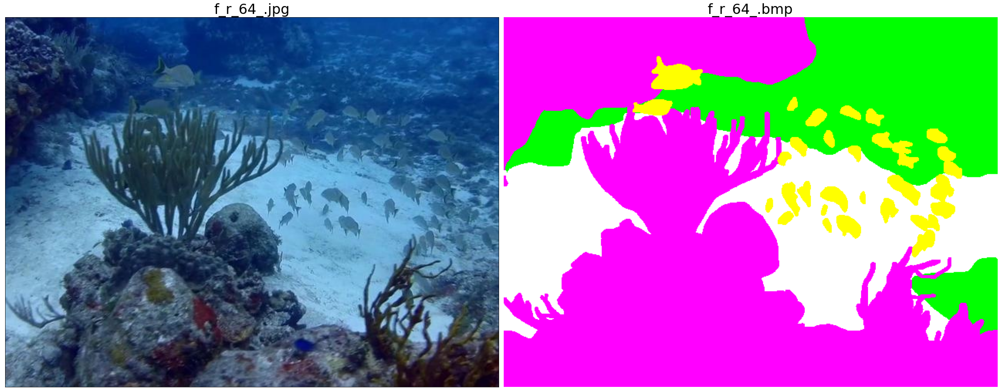

In [19]:
plot_image_and_mask()

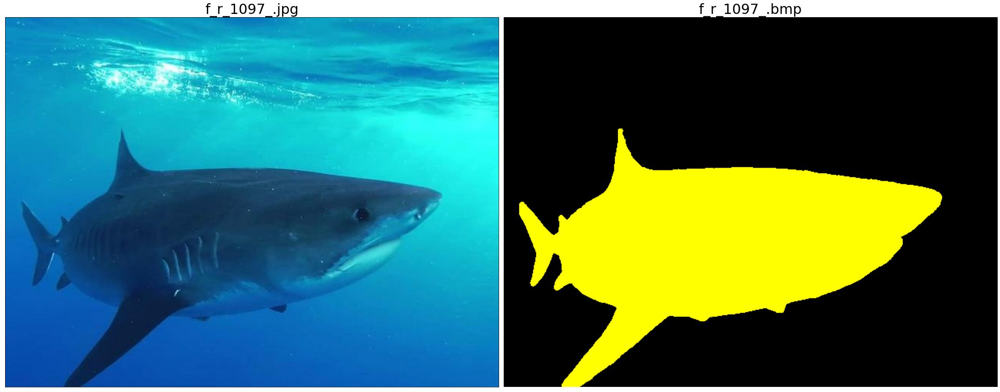

In [20]:
plot_image_and_mask()

Let's define the color to class mapping for the mask RGB colors as provided in the problem description

In [21]:
# defining color-class mapping and color-name mapping
color_class_mapping={(0, 0, 0): 0,
                    (0, 0, 255): 1,
                    (0, 255, 0): 2,
                    (0, 255, 255): 3,
                    (255, 0, 0): 4,
                    (255, 0, 255): 5,
                    (255, 255, 0): 6,
                    (255, 255, 255): 7}

color_name_mapping={(0, 0, 0): 'black',
                    (0, 0, 255): 'blue',
                    (0, 255, 0): 'green',
                    (0, 255, 255): 'sky',
                    (255, 0, 0): 'red',
                    (255, 0, 255): 'pink',
                    (255, 255, 0): 'yellow',
                    (255, 255, 255): 'white'}

## Masks visualisation with contours

Let's find the unique colors in mask and draw segmentation contours for any color present in it. Also let's use orange color of RGB (255,85,0) for drawing contour. Orange color is chosen because most of the other prominent colors are already present in the masks

In [22]:
# defining orange color to draw contour on mask
orange=(255,85,0)

In [23]:
# function to draw contour around any random color present in the mask
def draw_contour_for_one_color_on_mask():
    figure,axis = plt.subplots(1,3,figsize=(30,30))
    plt.axis('off')
    k=random.randint(0, total_images_train-1) # choosing any random image
    
    img_path=os.path.join(train_images_path, train_imgs_list[k]) # defining image path
    img_title=os.path.basename(img_path) # extracting basename from path
    img=cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    
    mask_path=os.path.join(train_masks_path, train_masks_list[k]) # defining mask path
    mask_title=os.path.basename(mask_path) # extracting basename from path
    mask=cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)
    
    mask_copy=copy.deepcopy(mask) # creating a copy of mask to draw contour
    pixels = mask.reshape((-1, 3))
    unique_colors = np.unique(pixels, axis=0) # getting unique colors present in mask
    
    #getting only those unique colors which are defined in problem
    unique_colors_defined = [value for value in unique_colors if tuple(value) in color_class_mapping]
    unique_colors_defined = np.array(unique_colors_defined, dtype=np.uint8)
    total_colors=len(unique_colors_defined)
    j=random.randint(0, total_colors-1) # selecting any random color among all the defined colors present in mask
    color=unique_colors_defined[j]
    # defining title for contour on mask
    mask_copy_title=os.path.basename(mask_path)+' with contour on color ' +str(color_name_mapping[tuple(color)])
    
    mask_mask = cv2.inRange(mask, color, color) # getting mask of the selcted color on the mask-image
    contours, hrc = cv2.findContours(mask_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) # finding contours
    cv2.drawContours(mask_copy, contours, -1, orange, 4) # drawing contours
    
    axis[0].imshow(img) # displaying image
    axis[0].set_title(img_title, fontsize=30)
    axis[0].set_xticks([])
    axis[0].set_yticks([])
    axis[1].imshow(mask) # displaying mask 
    axis[1].set_title(mask_title, fontsize=30)
    axis[1].set_xticks([])
    axis[1].set_yticks([])
    axis[2].imshow(mask_copy) # displaying copy of mask with contour 
    axis[2].set_title(mask_copy_title, fontsize=30)
    axis[2].set_xticks([])
    axis[2].set_yticks([])

    plt.tight_layout()
    plt.show()

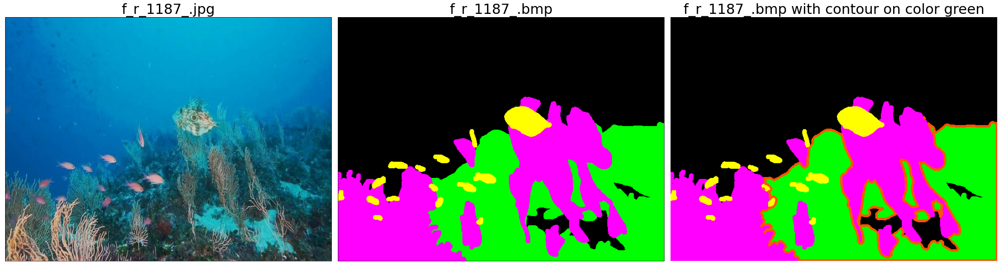

In [24]:
draw_contour_for_one_color_on_mask()

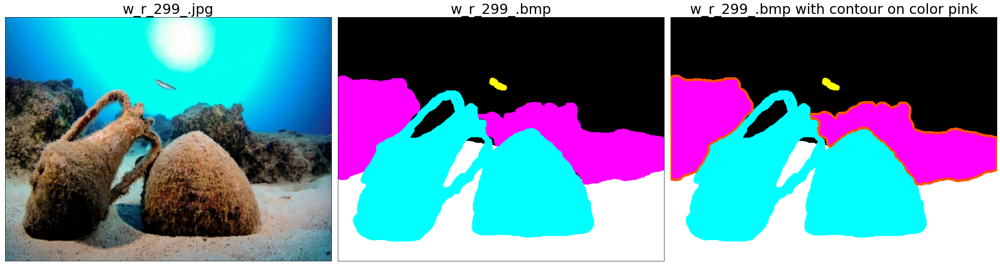

In [25]:
draw_contour_for_one_color_on_mask()

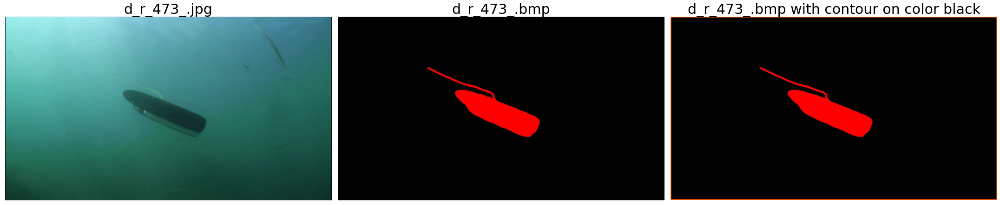

In [26]:
draw_contour_for_one_color_on_mask()

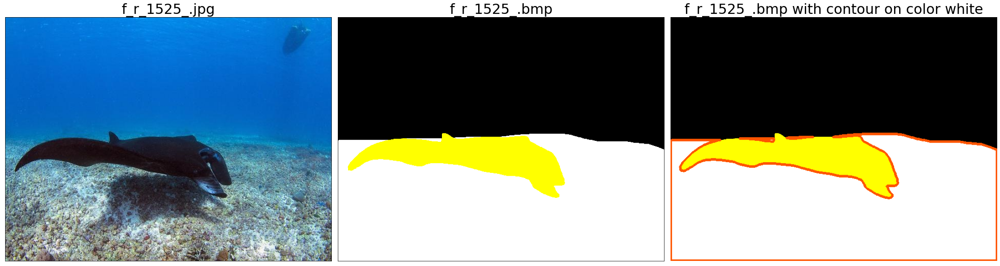

In [27]:
draw_contour_for_one_color_on_mask()

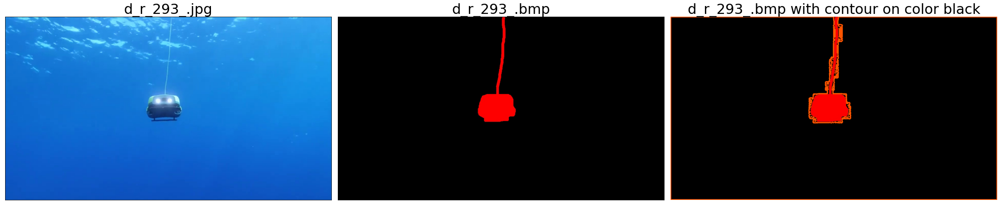

In [28]:
draw_contour_for_one_color_on_mask()

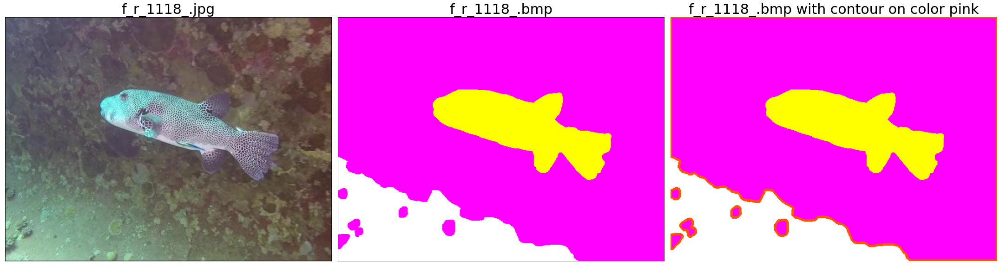

In [29]:
draw_contour_for_one_color_on_mask()

## Writing text file for masks

Now that there is a way to extract contours, let's define a function to write text file for all the contours for all the colors present in a mask.

In [30]:
def write_polygon_file(class_contour_mapping, H, W, output_path, img_name):
    coordinates={}
    for obj in class_contour_mapping: # looping through all colors present in the mask
        polygons = []
        for cnt in class_contour_mapping[obj]: # looping through all contours present in the color
            if cv2.contourArea(cnt) > 20: # neglecting very small contours
                polygon = []
                for point in cnt: # looping through all points present in the contour
                    x, y = point[0]
                    polygon.append(round(x / W, 4))
                    polygon.append(round(y / H, 4))
                polygons.append(polygon)
        coordinates[obj]=polygons

    # creating text file for all contours of all colors present in mask
    with open('{}.txt'.format(os.path.join(output_path, img_name)), 'w') as f:
        for obj in coordinates:
            for polygon in coordinates[obj]:
                for p_, p in enumerate(polygon):
                    if p_ == len(polygon) - 1:  # if point is the last point in contour, need to give newline
                        f.write('{}\n'.format(p))
                    elif p_ == 0: # if point is the first point in contour, need to specify color also
                        f.write('{} {} '.format(obj, p))
                    else: # any other point between first and last
                        f.write('{} '.format(p))

Now, it's time to create segmentation label text files for all the training masks. Let's have a progress bar to visually check the progress of writing text files.

In [31]:
# defining progress bar for visualising progress of writing text files
progress_bar=widgets.FloatProgress(value=0, min=0, max=100, description='Progress', 
                                   layout=widgets.Layout(width='100%'))
progress_bar

FloatProgress(value=0.0, description='Progress', layout=Layout(width='100%'))

In [32]:
m=0 # for counting total number of labels created

for img in train_masks_list:
    
    image=cv2.cvtColor(cv2.imread(os.path.join(train_masks_path,img)), cv2.COLOR_BGR2RGB)
    
    pixels = image.reshape((-1, 3))
    unique_colors = np.unique(pixels, axis=0) # getting unique colors present in mask
    
    #getting only those unique colors which are defined in problem
    unique_colors_defined = [value for value in unique_colors if tuple(value) in color_class_mapping]
    unique_colors_defined = np.array(unique_colors_defined, dtype=np.uint8)
    total_colors=len(unique_colors_defined)
        
    img_name=os.path.splitext(img)[0] # extracting mask name
    img_full_name=img_name+'.jpg' # getting image name corresponding to the extracted mask name

    img_path=os.path.join(train_images_path, img_full_name) # getting image path
    shutil.copy(img_path, op_images_trainpath) # copying image to output train path

    H,W,_=image.shape # extracting mask dimensions
    class_contour_mapping={}

    for i in range(total_colors): # looping through all colors present in mask
        color=unique_colors_defined[i] # extracting the color
        class_code=color_class_mapping[tuple(color)] # getting color-code
        mask = cv2.inRange(image, color, color) # getting mask of color on the mask-image
        contours, hrc = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) # finding contours
        class_contour_mapping[class_code]=contours # mapping color-code to contours
            
    # writing label text file    
    write_polygon_file(class_contour_mapping, H, W, op_labels_trainpath, img_name)
    m=m+1
    progress_bar.value=m/len(train_masks_list)*100    # updating progress bar
    
print("Total number of labels created: ", m)    

Total number of labels created:  1525


Again, the above process is to be repeated for test masks and images, so progress bar will be used again

In [33]:
# Restarting the progress bar to track the progress of test label files creation
progress_bar.value=0
progress_bar

FloatProgress(value=0.0, description='Progress', layout=Layout(width='100%'))

In [34]:
m=0
for img in test_masks_list:
    
    image=cv2.cvtColor(cv2.imread(os.path.join(test_masks_path,img)), cv2.COLOR_BGR2RGB)
    
    pixels = image.reshape((-1, 3))
    unique_colors = np.unique(pixels, axis=0)
    unique_colors_defined = [value for value in unique_colors if tuple(value) in color_class_mapping]
    unique_colors_defined = np.array(unique_colors_defined, dtype=np.uint8)
    total_colors=len(unique_colors_defined)
    img_name=os.path.splitext(img)[0]
    img_full_name=img_name+'.jpg'

    img_path=os.path.join(test_images_path, img_full_name)
    shutil.copy(img_path, op_images_testpath)

    H,W,_=image.shape
    class_contour_mapping={}
    for i in range(total_colors):
        color=unique_colors_defined[i]
        class_code=color_class_mapping[tuple(color)]
        mask = cv2.inRange(image, color, color)
        contours, hrc = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        class_contour_mapping[class_code]=contours

    write_polygon_file(class_contour_mapping, H, W, op_labels_testpath, img_name)
    m=m+1
    progress_bar.value=m/len(test_masks_list)*100

    
print("Total number of labels created: ", m)   

Total number of labels created:  110


## Separating training and validation dataset

Now, it's time to carve out validation data from training data. Let's create validation dataset of the same size as the test dataset

In [35]:
# function for creating validation dataset
def create_validation_data(dataset, size):
    random.shuffle(dataset)
    validation_data=dataset[:size]
    return validation_data
    

In [36]:
# creating validation dataset of size 110 from training dataset
validation_datalist=create_validation_data(train_imgs_list, 110)

Let's move the validation images and labels from training directory to validation directory

In [37]:
for img in validation_datalist:
    imgsrc_path=os.path.join(op_images_trainpath, img)
    imgdst_path=os.path.join(op_images_valpath, img)
    shutil.move(imgsrc_path, imgdst_path)
    
    img_name=os.path.splitext(img)[0]
    label_file=img_name+'.txt'
    
    labelsrc_path=os.path.join(op_labels_trainpath,label_file)
    labeldst_path=os.path.join(op_labels_valpath,label_file)
    shutil.move(labelsrc_path, labeldst_path)

## Creating config file

In [38]:
# defining newline variable for config file
newline='\n'

In [39]:
# defining lines of config text file

ln_1='# Train/val/test sets'+newline # starting with a comment line

# train, val and test path declaration
ln_2='train: ' +"'"+op_images_trainpath+"'"+newline
ln_3='val: ' +"'" + op_images_valpath+"'"+newline
ln_4='test: ' +"'" + op_images_testpath+"'"+newline
ln_5=newline

# names of the classes declaration
ln_6='names:'+newline
ln_7='  0: Background'+newline
ln_8='  1: Human divers'+newline
ln_9='  2: Aquatic plants and sea-grass'+newline
ln_10='  3: Wrecks and ruins'+newline
ln_11='  4: Robots'+newline
ln_12='  5: Reefs and invertebrates'+newline
ln_13='  6: Fish and vertebrates'+newline
ln_14='  7: Sea-floor and rocks'
config_lines=[ln_1, ln_2, ln_3, ln_4, ln_5, ln_6, ln_7, ln_8, ln_9, ln_10, ln_11, ln_12, ln_13, ln_14]

In [40]:
# Creating path for config file
config_path=os.path.join(op_path, 'config.yaml')
config_path

'D:/University_Windsor/Winter_2024/ASE/POC\\config.yaml'

In [41]:
# Writing config file
with open(config_path, 'w') as f:
    f.writelines(config_lines)

## Model training

In [42]:
# Choosing a YOLOv8 segmentation model for training with pretrained weights
model=YOLO('yolov8m-seg.yaml').load('yolov8m-seg.pt')

100%|█████████████████████████████████████████████████████████████████████████████| 52.4M/52.4M [00:01<00:00, 38.4MB/s]


Transferred 537/537 items from pretrained weights


Let's train the model for 100 epochs and also give inputs for augmentations. Augmentations create variations of original data which helps in improving model's performance and generalisation

In [ ]:
# Training the model; here degrees, shear and perspective are augmentation arguments
results=model.train(data=config_path, epochs=100, degrees=60, shear=30, perspective=0.0005, show_boxes=False)

Ultralytics YOLOv8.1.18 🚀 Python-3.9.4 torch-2.2.1+cpu CPU (Intel Core(TM) i5-1035G1 1.00GHz)
engine\trainer: task=segment, mode=train, model=yolov8m-seg.yaml, data=D:/University_Windsor/Winter_2024/ASE/POC\config.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fals

100%|███████████████████████████████████████████████████████████████████████████████| 755k/755k [00:00<00:00, 18.1MB/s]


Overriding model.yaml nc=80 with nc=8

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

Freezing layer 'model.22.dfl.conv.weight'


train: Scanning D:\University_Windsor\Winter_2024\ASE\POC\labels\train... 1415 images, 0 backgrounds, 0 corrupt: 100%|█


train: New cache created: D:\University_Windsor\Winter_2024\ASE\POC\labels\train.cache


val: Scanning D:\University_Windsor\Winter_2024\ASE\POC\labels\val... 110 images, 0 backgrounds, 0 corrupt: 100%|██████


val: New cache created: D:\University_Windsor\Winter_2024\ASE\POC\labels\val.cache
Plotting labels to runs\segment\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 86 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\segment\train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/89 [00:00<?, ?it/s]

Results can be converted to a zip file using the following command which is commented right now. This zip file can be downloaded later if results are to be analysed locally

In [ ]:
# !zip -r results.zip /kaggle/working/runs/segment/train

Let's see how the training progressed with epochs by visualizing the plots

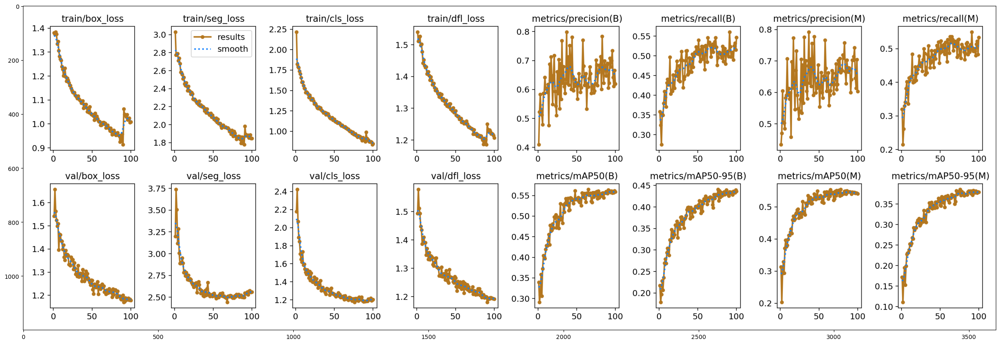

In [43]:
plt.figure(figsize=(30,30))
trainingresult_path=os.path.join(op_path, 'runs', 'segment', 'train')
results_png=cv2.imread(os.path.join(trainingresult_path,'results.png'))
plt.imshow(results_png)

All losses- Box loss, seg loss, class loss, dfl loss are decreasing with epochs.
All metrics- Precision, Recall, mAP50 and mAP50-95 are increasing with epochs

## Model Performance

Let's write functions for evaluating model metrics and displaying plots

In [44]:
# function for evaluating model metrics map50
def evaluate_map50(trainedmodel, data_path, dataset='val'):
    metrics=trainedmodel.val(data=data_path, split=dataset)
    map50=round(metrics.seg.map50, 3)
    print("The map of model for all images on {0} dataset is {1}".format(dataset,map50))
    return metrics, map50

In [45]:
   
# function for displaying plots created by YOLO
def display_curves(root_path):
    plt.figure(figsize=(50,50))
    
    #displaying mask p curve
    p_curve=cv2.imread(os.path.join(root_path,'MaskP_curve.png'))
    ax=plt.subplot(5,1,1)
    plt.imshow(p_curve)
    
    #displaying mask r curve
    r_curve=cv2.imread(os.path.join(root_path,'MaskR_curve.png'))
    ax=plt.subplot(5,1,2)
    plt.imshow(r_curve)
    
    #displaying mask pr curve
    pr_curve=cv2.imread(os.path.join(root_path,'MaskPR_curve.png'))
    ax=plt.subplot(5,1,3)
    plt.imshow(pr_curve)
    
    #displaying mask f1 curve
    f1_curve=cv2.imread(os.path.join(root_path,'MaskF1_curve.png'))
    ax=plt.subplot(5,1,4)
    plt.imshow(f1_curve)
    
    #displaying confusion matrix
    confusion_matrix=cv2.imread(os.path.join(root_path,'confusion_matrix.png'))
    ax=plt.subplot(5,1,5)
    plt.imshow(confusion_matrix)

In [46]:
# Evaluating test metrics
test_metrics, test_map50=evaluate_map50(model, config_path, dataset='test')

Ultralytics YOLOv8.1.18 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27227016 parameters, 0 gradients, 110.0 GFLOPs


val: Scanning /kaggle/working/labels/test... 110 images, 0 backgrounds, 0 corrupt: 100%|██████████| 110/110 [00:00<00:00, 194.16it/s]

val: New cache created: /kaggle/working/labels/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]


                   all        110       1201      0.619      0.559      0.581      0.431      0.607      0.552      0.564      0.375
            Background        110        309      0.577      0.586       0.57      0.404      0.571      0.579      0.547      0.362
          Human divers        110         58      0.736      0.879      0.908      0.763      0.736      0.879      0.893      0.673
Aquatic plants and sea-grass        110         70      0.307      0.158      0.142     0.0772      0.278      0.143      0.139     0.0472
      Wrecks and ruins        110         39       0.81       0.59       0.62      0.512       0.74      0.538      0.552      0.392
                Robots        110         17      0.683      0.706      0.765      0.575      0.742      0.765      0.817      0.567
Reefs and invertebrates        110        159      0.544      0.365      0.408      0.292      0.528      0.352      0.373      0.242
  Fish and vertebrates        110        414      0.724      0

In [47]:
# Path storing model's performance on test dataset
test_path=os.path.join(op_path, 'runs', 'segment', 'val') #val is a misnomer, it is actually measuring validation on test dataset

[ WARN:0@11359.514] global loadsave.cpp:248 findDecoder imread_('/kaggle/working/runs/segment/val/MaskP_curve.png'): can't open/read file: check file path/integrity


TypeError: Image data of dtype object cannot be converted to float

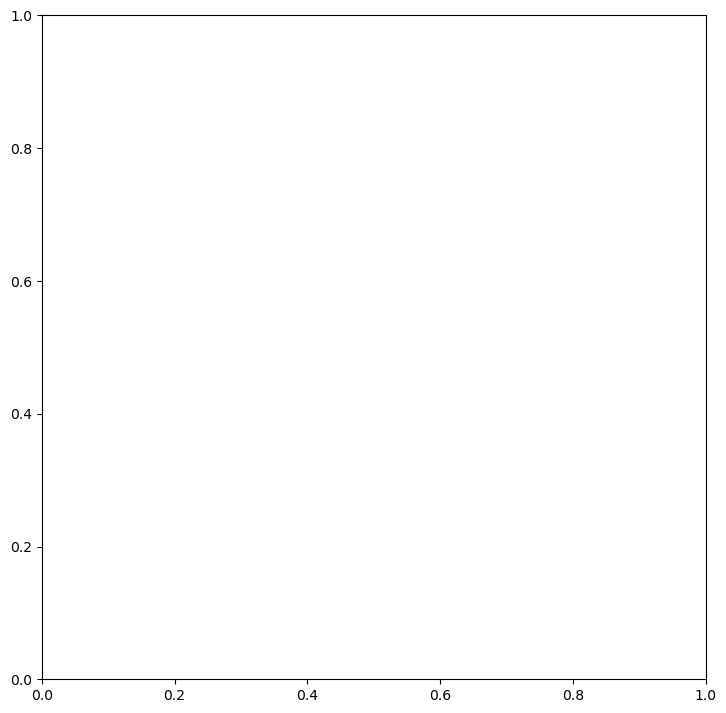

In [48]:
# Display plots on test data
display_curves(test_path) 

## Visualizing model's performance on random test images


image 1/1 /kaggle/working/images/test/d_r_277_.jpg: 384x640 2 Backgrounds, 2 Human diverss, 1 Robots, 1 Reefs and invertebrates, 34.3ms
Speed: 2.3ms preprocess, 34.3ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/images/test/d_r_598_.jpg: 480x640 5 Backgrounds, 2 Human diverss, 1 Reefs and invertebrates, 1 Fish and vertebrates, 39.0ms
Speed: 1.2ms preprocess, 39.0ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/working/images/test/d_r_196_.jpg: 384x640 4 Backgrounds, 4 Human diverss, 2 Robotss, 1 Sea-floor and rocks, 34.2ms
Speed: 1.9ms preprocess, 34.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


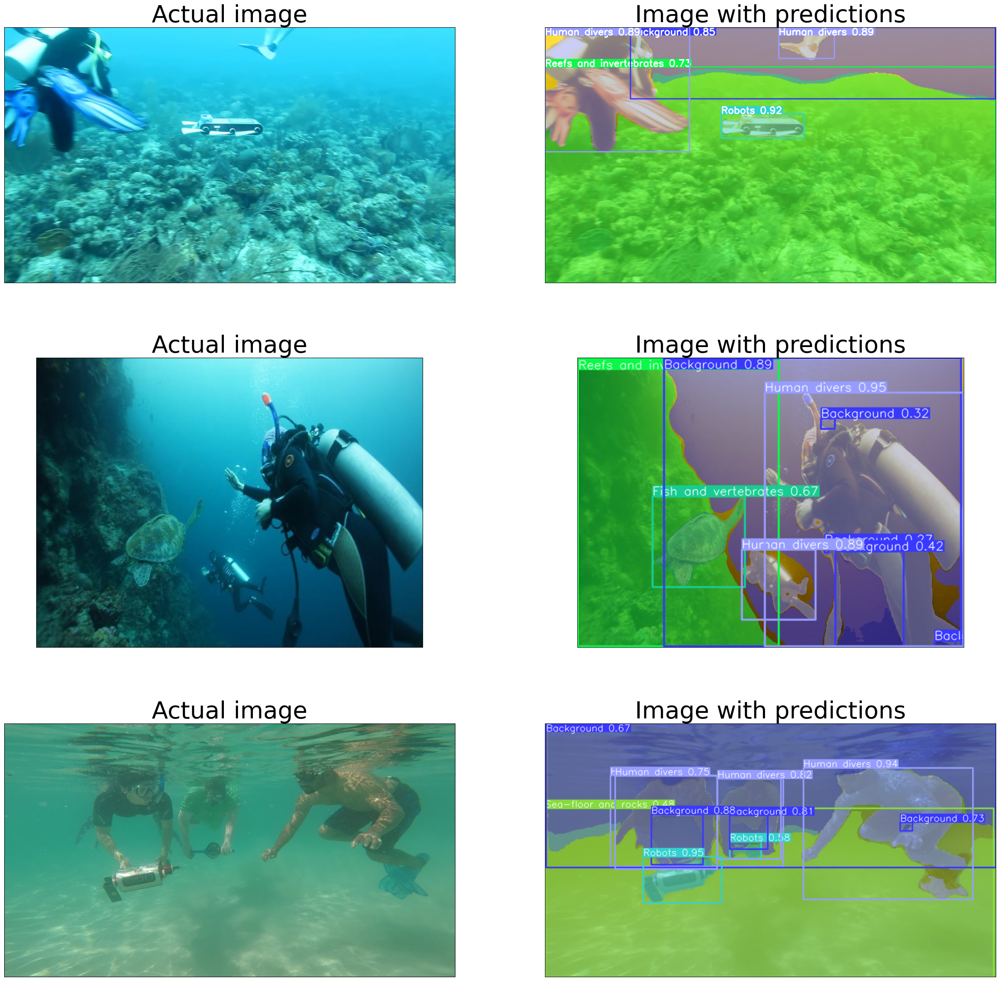

In [59]:
plt.figure(figsize=(30,30))

for i in range(1,6,2):
    m=random.randint(0, len(test_imgs_list)) # Selecting random image number from test dataset
    test_image=os.path.join(op_images_testpath, os.listdir(test_images_path)[m])
    ax=plt.subplot(3,2,i)
    
    # Display actual image
    plt.imshow(cv2.cvtColor(cv2.imread(test_image), cv2.COLOR_BGR2RGB)) 
    plt.xticks([])
    plt.yticks([])
    plt.title("Actual image", fontsize = 40)
    
    # Predict 
    res = model(test_image)
    res_plotted = res[0].plot()
    ax=plt.subplot(3,2,i+1)
    
    # Display image with predictions
    plt.imshow(res_plotted)
    plt.title("Image with predictions", fontsize = 40)
    plt.xticks([])
    plt.yticks([])


This is how image segmentation can be done using YOLOv8. Thanks for checking